# Virus Spread

## Introduction and importing modules

In this project we are going to simulate the spread of the virus in in random graph, additionally we are going to check the different behavior of the virus with different parameters such as virality, mortality, period of incubation and period of recovery 

In [1]:
import numpy.random as random
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import networkx as nx
from nxviz import CircosPlot, ArcPlot
import os

## Checking the random module and Networkx module

First we are going to check the distribution of random values provided us by random module.

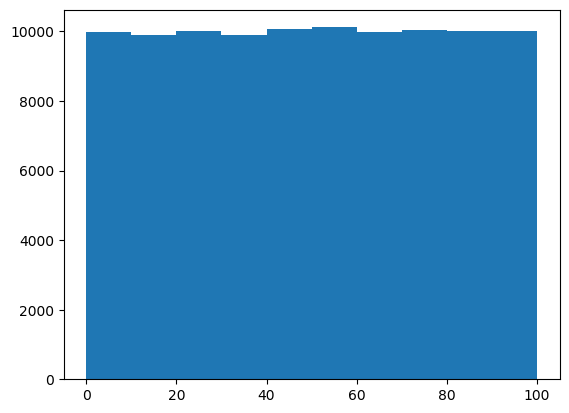

In [2]:
randoms = []
for x in range(100000):
    randoms.append(random.rand()*100)
plt.style.use('default')
plt.hist(randoms)
plt.show()

We can see that random module generate random numbers (i.i.d.), which can be used in terms of probability for Bernoulli trials. So, if we want to create a random event with probability 80% we can use random number generated and let the event happened if the number is lower than .8

<Figure size 640x480 with 0 Axes>

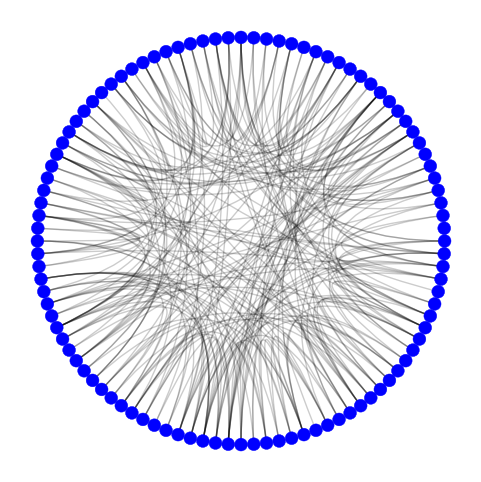

In [3]:
plt.clf()
n = 100
p = 0.05
G = nx.gnp_random_graph(n, p, seed=None, directed=False)
c = CircosPlot(G)
c.draw()
plt.show()

Here we just check our random graph

In [4]:
list(nx.isolates(G)) # check if there are any isolated nodes

[51]

We are going to check the degree distribution to ensure that nodes have in general around 5 neighbors

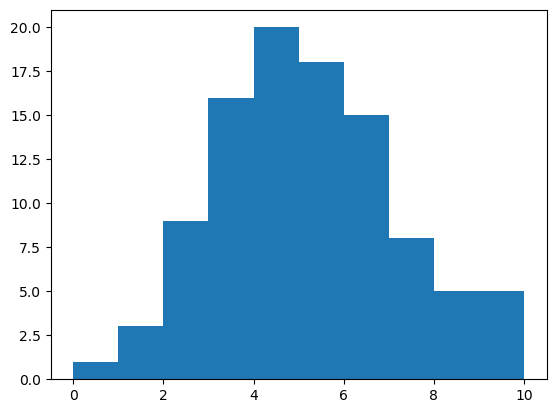

In [5]:
def plot_degree_dist(G):
    degrees = [G.degree(n) for n in G.nodes()]
    plt.hist(degrees)
    plt.show()
plot_degree_dist(G)

Now we are going to initialize random weights for each edge
Some people have more frequent contacts than others, let show it in weights which will be also the probability of propagating virus. 
Additionally virality will affect these probabilities, virality will be the value from 0 to 1 and it will be multiplied by weight of the edge (weight of the edge reflects the probability of transmission in case of virality 1)

In [6]:
for i in list(G.edges()):
    weight = random.rand()
    G.edges[i]['weight'] = weight

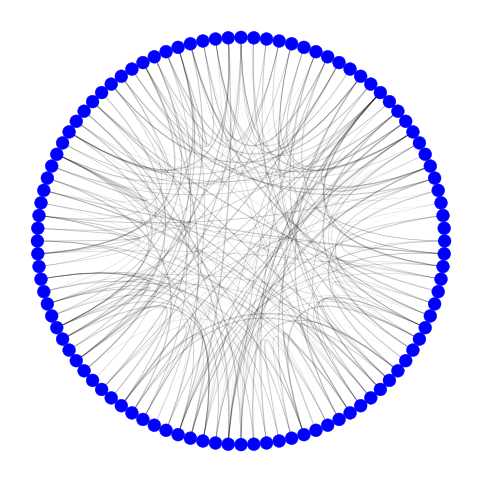

In [7]:
c = CircosPlot(G, edge_width='weight')
c.draw()
plt.show()# show weighted network

In [8]:
# initialize the status
for n in G.nodes():
    G.node[n]['healthy'] = 1
    G.node[n]['infected'] = 0
    G.node[n]['sick'] = 0
    G.node[n]['dead'] = 0
    G.node[n]['recovered'] = 0
    G.node[n]['start'] = None
Date = 0

## Spread simulation function designing 

Virus will have 5 parameters 
Incubation (when person communicates to others and spread the virus), 
recovery (how many days does it take to recover after getting sick)
Mortality (every day of being sick a person can die with the probability of mortality)
Immunity adapt – the level how person is adapted to reinfection (Basically it decreases the probability of being re-infected by dividing probability by certain number
Virality – the chance of the virus itself to be transmitted 

Additionally we implement exponential increase of the mortality rate by 5 % for every new sick person, so if everybody is sick chances to die are much higher due to shortage in resources.

Finally we have 4 categories of status:
1)	Healthy
2)	Infected (no symptoms, but those nodes are spreading infection)
3)	Sick (doesn’t spread, but serious symptoms demand efforts from healthcare system)
4)	Recovered – healthy but immunized 
5)	Dead


In [9]:
def virus_spread_viz(G, virus, nodes, n_days, date = Date, viz = True):
    infected = []
    sick = []
    dead = []
    healthy = []
    sick_daily = 0 # first day no sick people
    current_date = Date
    nodes_inf = []
    for nodes_i in nodes:
        G.node[nodes_i]['healthy'] = 0
        G.node[nodes_i]['infected'] = 1
        G.node[nodes_i]['start'] = current_date
    while current_date <= n_days+Date:
        for n in list(G.nodes()):
            if G.node[n]['healthy'] == 1 or G.node[n]['recovered'] == 1:
                G.node[n]['status'] = 'healthy'
            elif G.node[n]['dead'] == 1:
                G.node[n]['status'] = 'dead'
            elif G.node[n]['infected'] == 1:
                G.node[n]['status'] = 'infected'
            elif G.node[n]['sick'] == 1:
                G.node[n]['status'] = 'sick'
            else:
                G.node[n]['status'] = 'no data'
        current_date += 1
        if viz == True:
            try:
                c = CircosPlot(G, node_color = 'status') ### nxviz cannot visualise node color 
                                                     ### if all nodes belongs to the same group
            except AssertionError:
                c = CircosPlot(G)
            c.draw()
            plt.show()
            print("current day:",current_date)
        # Spread simulation
        for n in list(G.nodes()):   
            if G.node[n]['infected'] == 1:
                for neighbor in nx.neighbors(G,n):
                    if G.node[neighbor]['status'] == 'healthy':
                        if G.node[neighbor]['recovered'] == 1:
                            if random.rand()<G.edges[n, neighbor]['weight']*virus['virality']/virus['immunity_adapt']: 
                                G.node[neighbor]['healthy'] = 0
                                G.node[neighbor]['infected'] = 1
                                G.node[neighbor]['recovered'] = 0
                                G.node[neighbor]['start'] = current_date
                            else:
                                pass
                        else:
                            if random.rand()<G.edges[n, neighbor]['weight']*virus['virality']:
                                G.node[neighbor]['healthy'] = 0
                                G.node[neighbor]['infected'] = 1
                                G.node[neighbor]['start'] = current_date
                            else:
                                pass
        # update status
        for n in list(G.nodes()):
            if G.node[n]['status'] == 'infected' and current_date-G.node[n]['start']>virus['incubation']:
                G.node[n]['recovered'] = 0
                G.node[n]['healthy'] = 0
                G.node[n]['infected'] = 0
                G.node[n]['sick'] = 1
                G.node[n]['dead'] = 0
            elif G.node[n]['status'] == 'sick' and current_date-G.node[n]['start']>virus['incubation']+virus['recovery']:
                G.node[n]['recovered'] =1
                G.node[n]['healthy'] = 0
                G.node[n]['infected'] = 0
                G.node[n]['sick'] = 0
                G.node[n]['dead'] = 0
            else:
                pass
        for n in list(G.nodes()):
            if G.node[n]['status'] == 'sick':
                # with every sick person chances to die increase by 5% due to overload of healthcare
                if random.rand()<virus['mortality']/virus['recovery']*1.05**sick_daily: 
                    G.node[n]['healthy'] = 0
                    G.node[n]['infected'] = 0
                    G.node[n]['sick'] = 0
                    G.node[n]['dead'] = 1
                    G.node[n]['recovered'] = 0
        ### This part is nessesary for time series analyses
        dead_daily = 0
        for n in list(G.nodes()):
            if G.nodes[n]['status']=='dead':
                dead_daily += 1
        dead.append(dead_daily)
        sick_daily = 0
        for n in list(G.nodes()):
            if G.nodes[n]['status']=='sick':
                sick_daily += 1
        sick.append(sick_daily)
        healthy_daily = 0
        for n in list(G.nodes()):
            if G.nodes[n]['status']=='healthy':
                healthy_daily += 1
        healthy.append(healthy_daily)
        infected_daily = 0
        for n in list(G.nodes()):
            if G.nodes[n]['status']=='infected':
                infected_daily += 1 
        infected.append(infected_daily)
    d = {'Healthy':healthy, 'Sick':sick,'Dead':dead,'Infected':infected}
    df = pd.DataFrame(d)
    return [G, df]

This is the function to nullify the graph to restart our simulations

In [10]:
def nulify_graph(G):
    for n in G.nodes():
        G.node[n]['healthy'] = 1
        G.node[n]['infected'] = 0
        G.node[n]['sick'] = 0
        G.node[n]['dead'] = 0
        G.node[n]['recovered'] = 0
        G.node[n]['start'] = None
        G.node[n]['status'] = None

## Simulation and exploration visualisation 

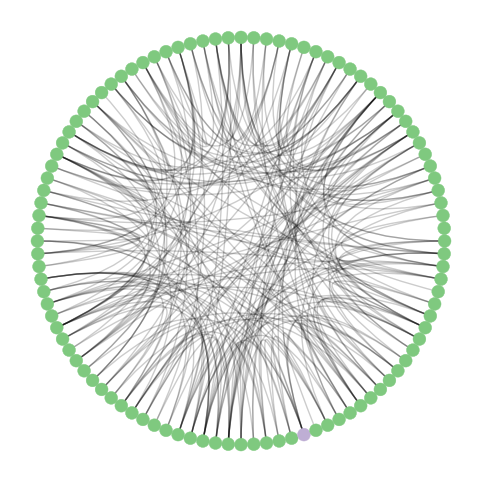

current day: 1


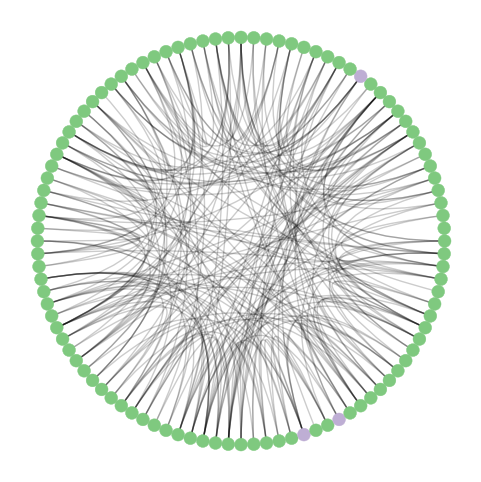

current day: 2


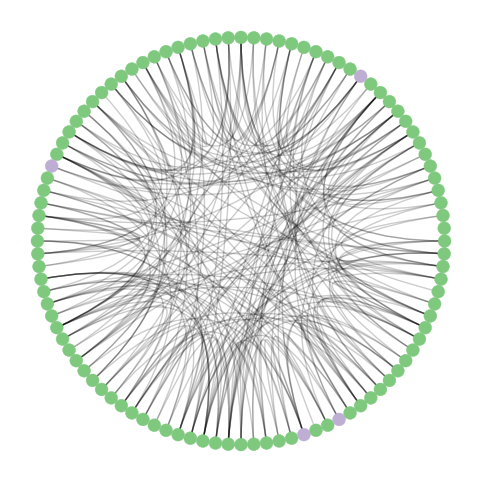

current day: 3


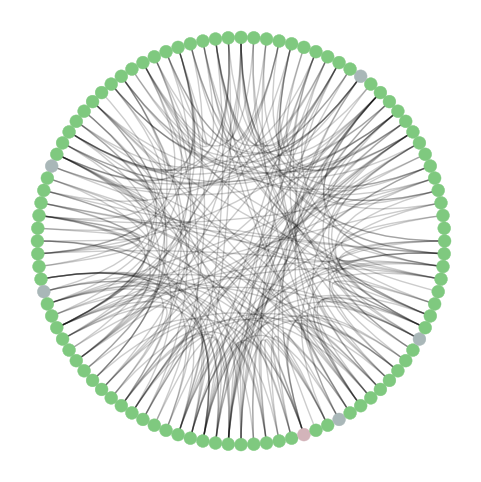

current day: 4


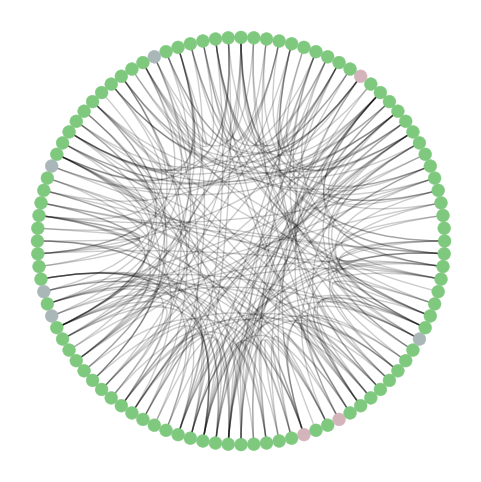

current day: 5


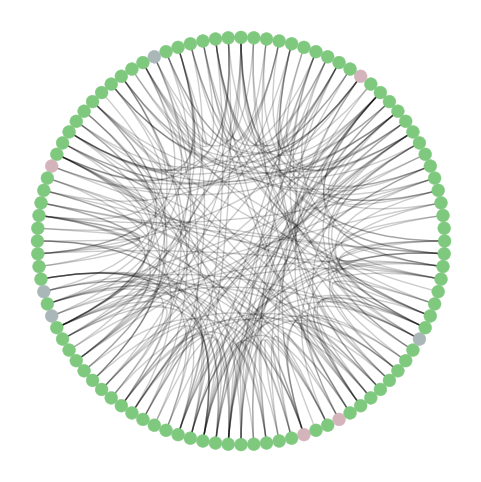

current day: 6


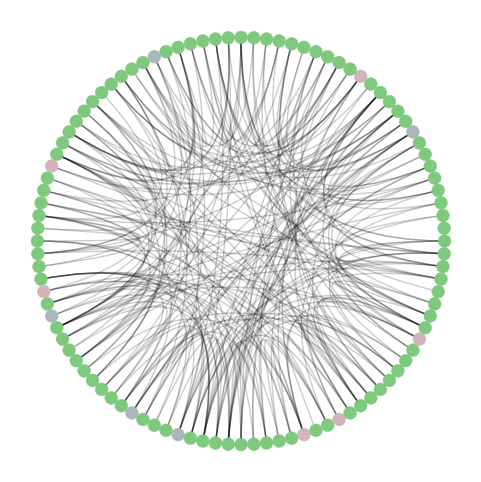

current day: 7


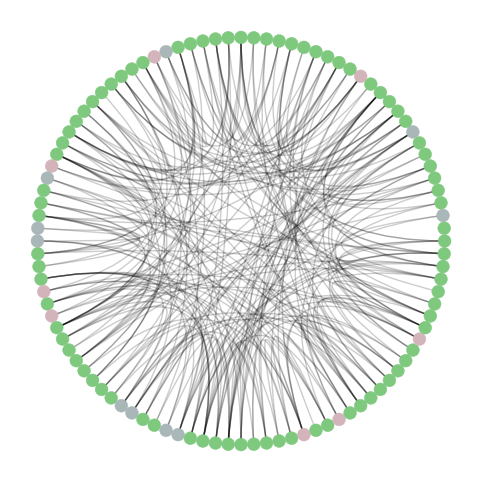

current day: 8


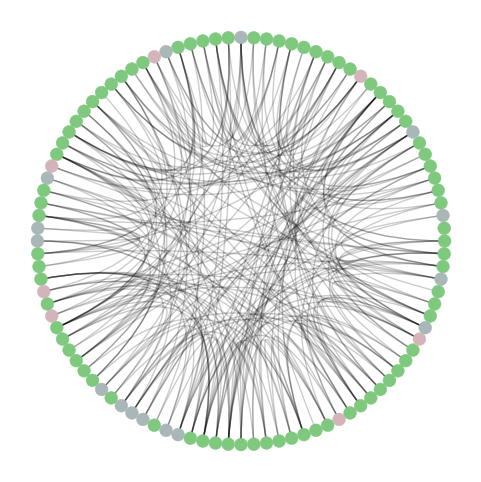

current day: 9


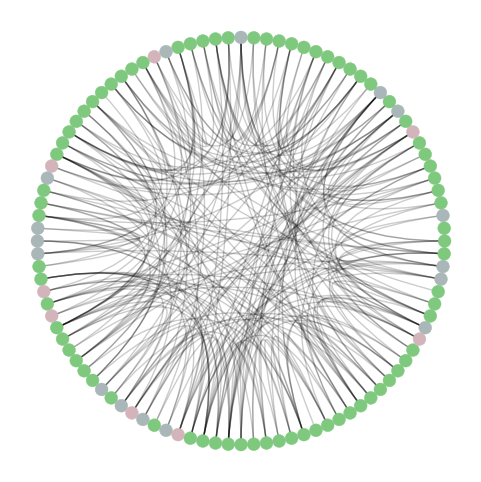

current day: 10


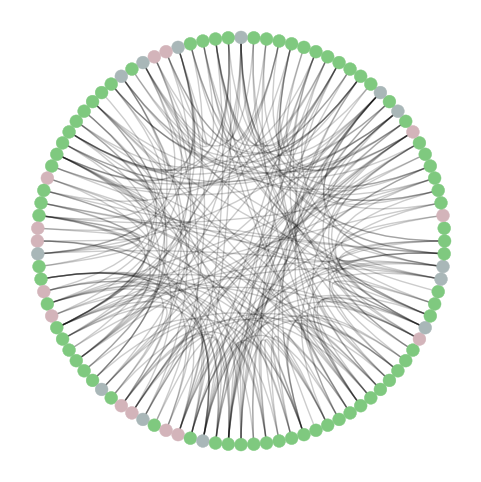

current day: 11


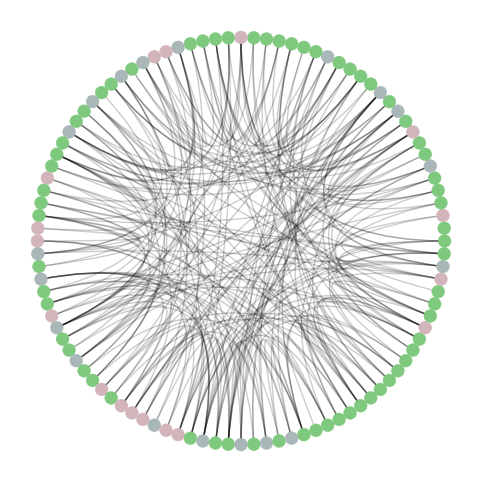

current day: 12


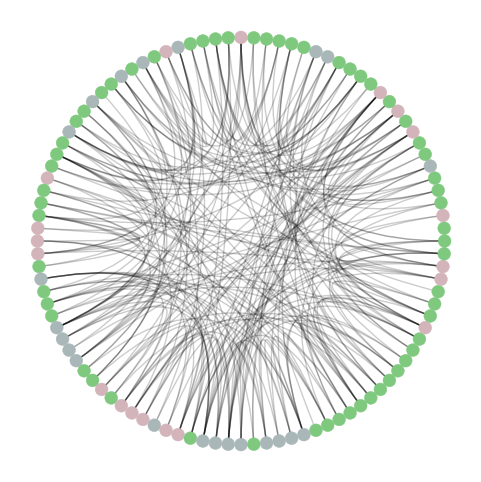

current day: 13


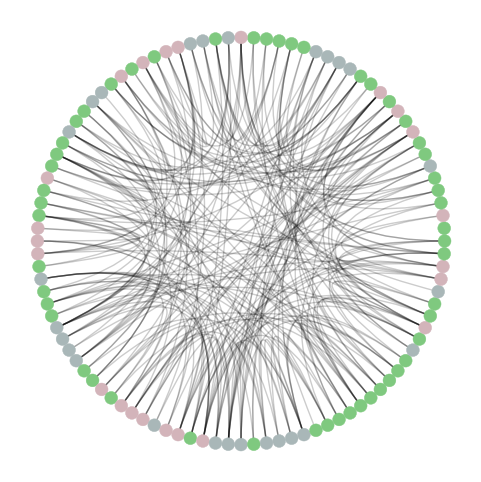

current day: 14


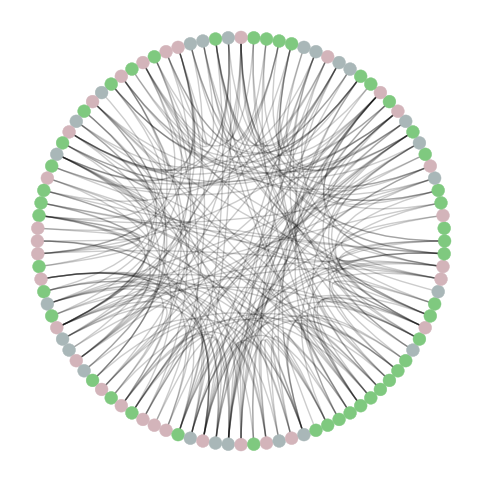

current day: 15


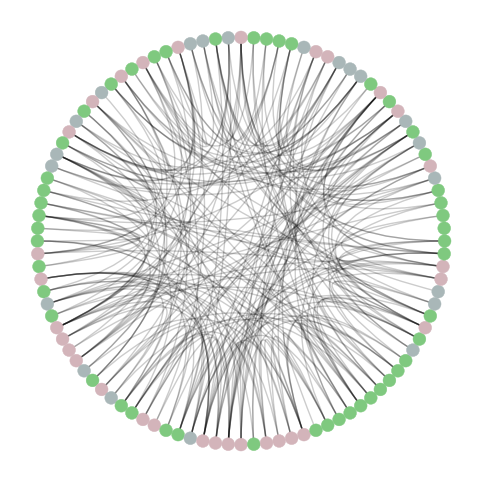

current day: 16


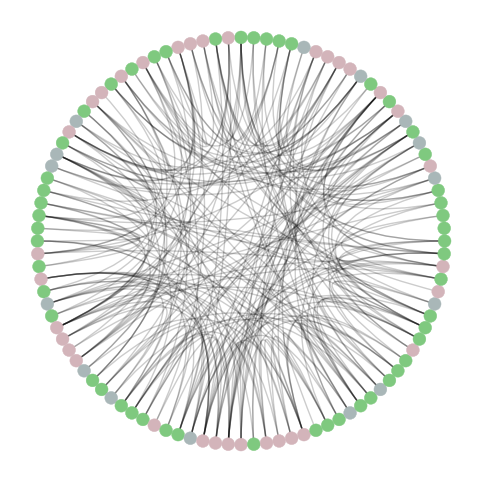

current day: 17


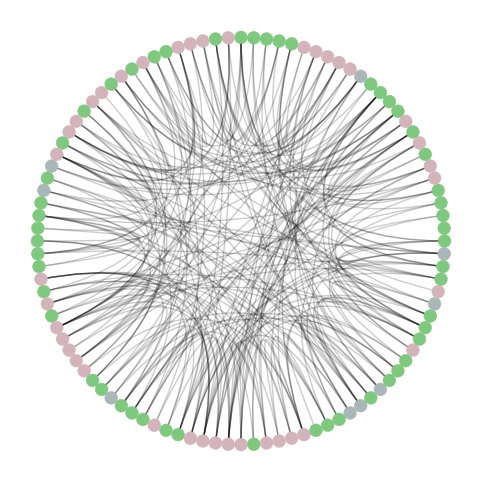

current day: 18


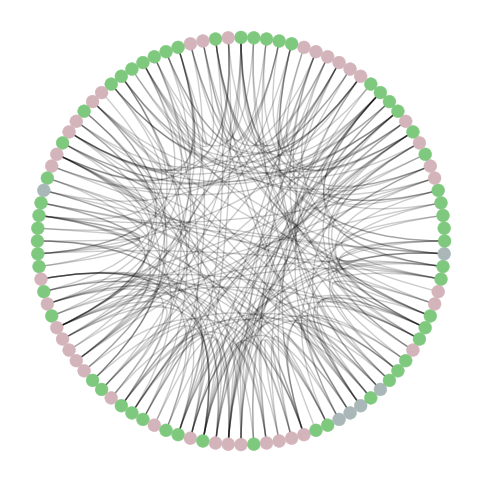

current day: 19


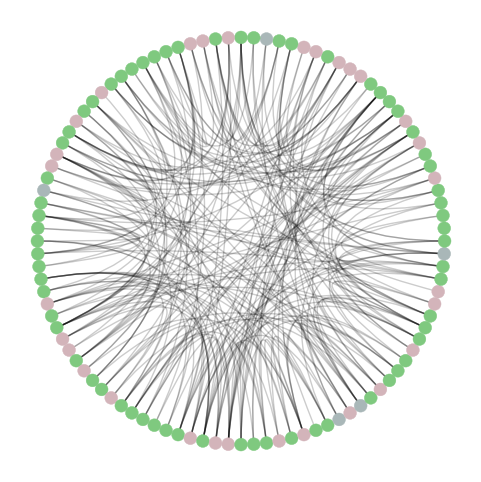

current day: 20


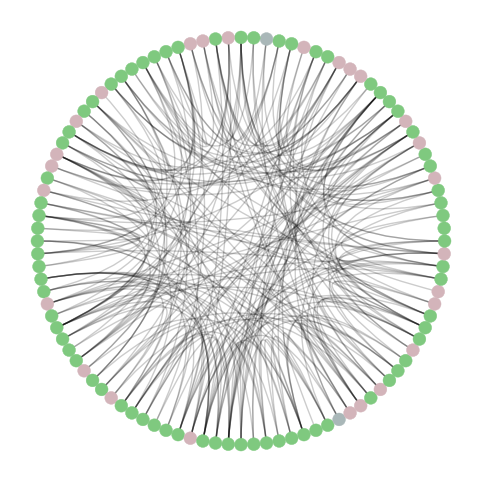

current day: 21


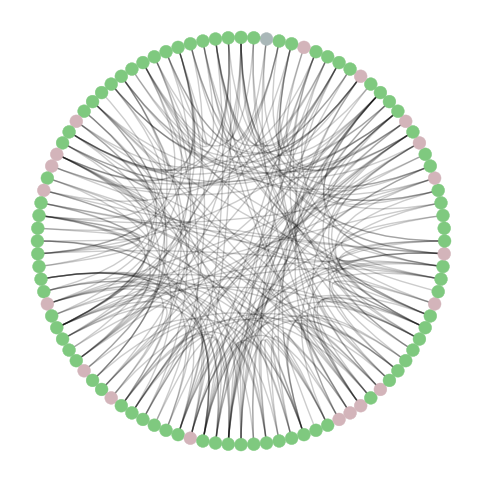

current day: 22


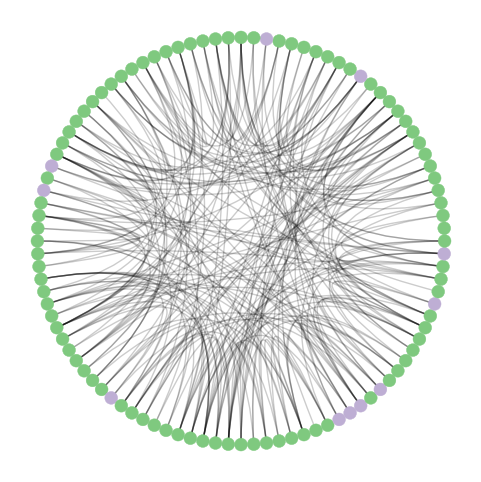

current day: 23


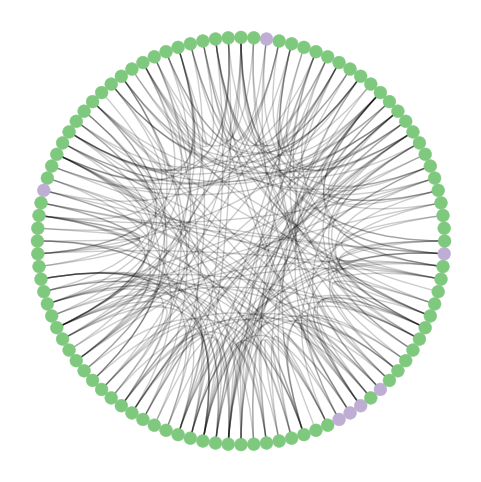

current day: 24


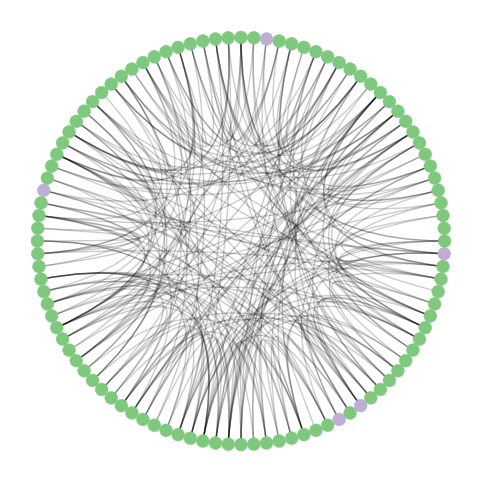

current day: 25


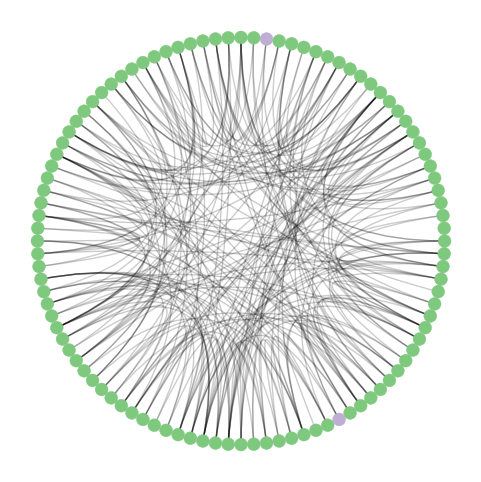

current day: 26


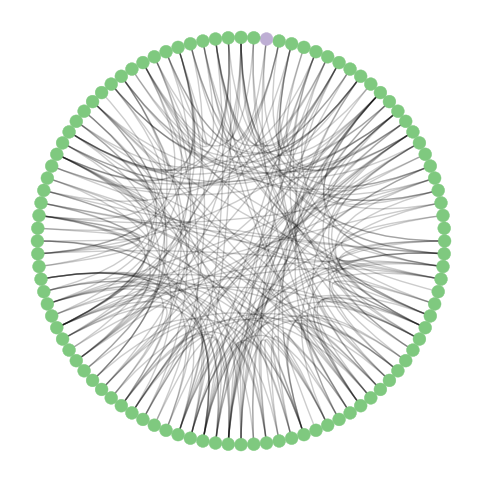

current day: 27


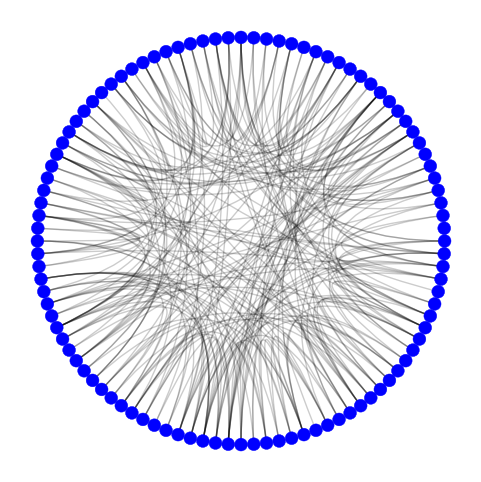

current day: 28


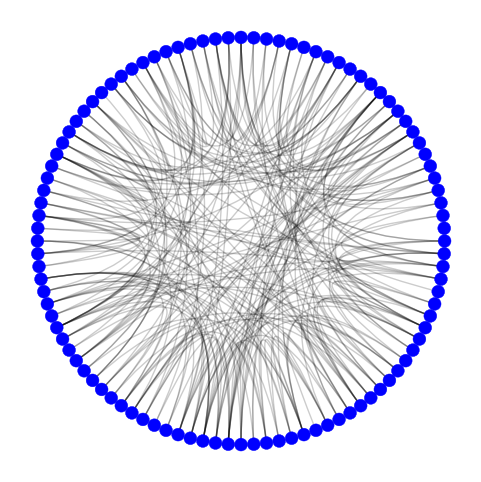

current day: 29


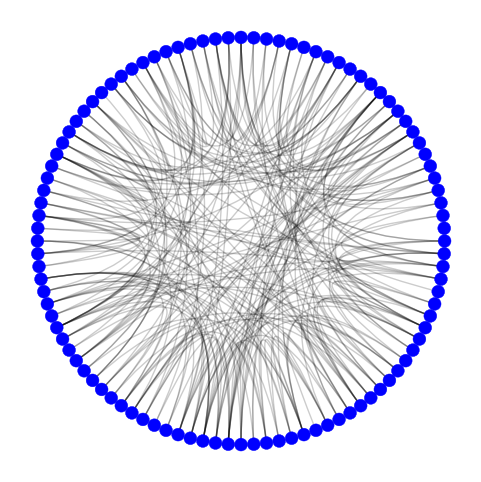

current day: 30


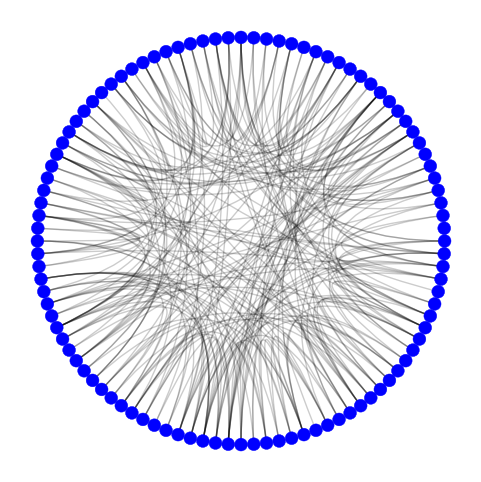

current day: 31


In [11]:
# Short incubation period and one week recovery, flu-like infection relatively low mortality, low virality due to vaccination
flu = {'incubation':2,'recovery':5,'mortality':.01, 'immunity_adapt':5, 'virality':.25} 
nulify_graph(G)  
Date = 0
results = virus_spread_viz(G, flu, [30], 30)
df = results[1]

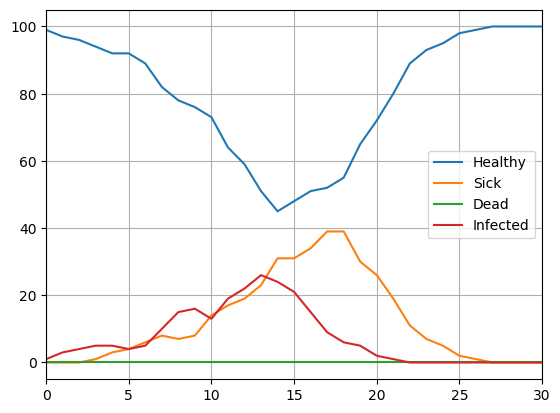

In [12]:
df.plot(grid = True)
plt.show()

With low virality and short incubation period infection dies out very fast

In [13]:
# same level of virality long incubation period, long period of recovery same mortality rate
# same immunity adaptation rate same virality
long_incubation_flu = {'incubation':15,'recovery':15,'mortality':.01, 'immunity_adapt':5, 'virality':.25}
nulify_graph(G)
Date = 0
results = virus_spread_viz(G, long_incubation_flu, [30], 60, viz = False)
df = results[1]

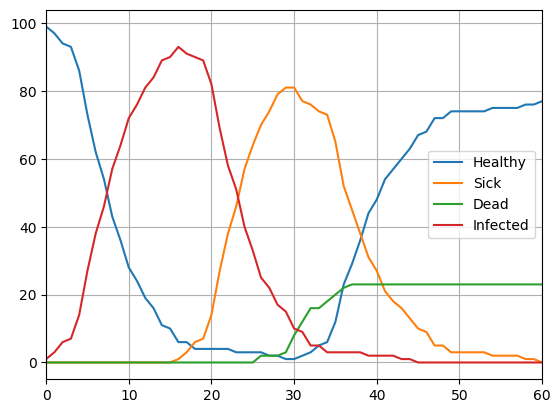

In [14]:
df.plot(grid=True)
plt.show() 

Unsurprisingly, high incubation period led to higher spread and higher recovery period makes many people being sick in the same time, so, despite initially we have 1 % chance to die for every sick node, in fact we got more than 20% death rate, due to overload of healthcare system

But what would happen, if the virus was 4 times more viral?

In [15]:
unknown_virus = {'incubation':15,'recovery':15,'mortality':.01, 'immunity_adapt':5, 'virality':1}
nulify_graph(G) 
Date = 0
results = virus_spread_viz(G, unknown_virus, [30], 60,viz = False)
df = results[1]

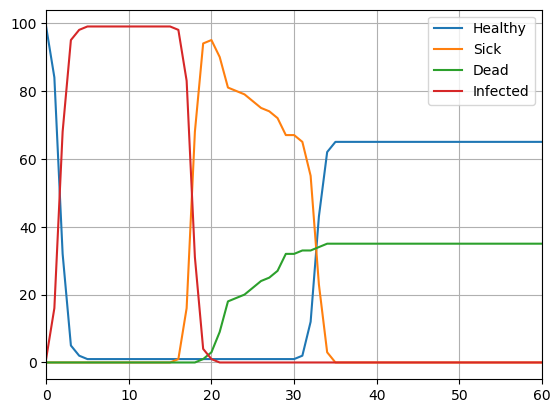

In [16]:
df.plot(grid=True)
plt.show() 

What if we slightly increase the mortality?

In [17]:
unknown_agressive_virus = {'incubation':15,'recovery':15,'mortality':.034, 'immunity_adapt':5, 'virality':1}
nulify_graph(G) 
Date = 0
results = virus_spread_viz(G, unknown_agressive_virus, [30], 60,viz = False)
df = results[1]

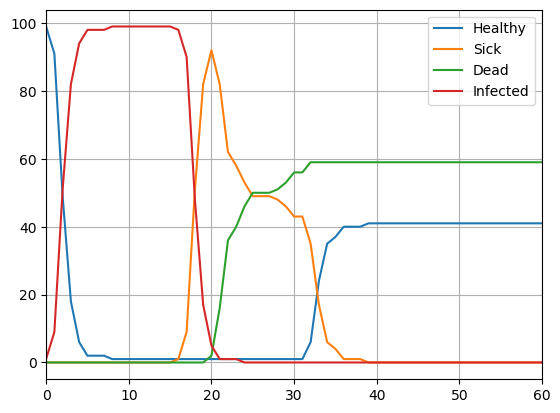

In [18]:
df.plot(grid=True)
plt.show()

In [19]:
df.head(25)

,Healthy,Sick,Dead,Infected
0,99,0,0,1
1,91,0,0,9
2,49,0,0,51
3,18,0,0,82
4,6,0,0,94
5,2,0,0,98
6,2,0,0,98
7,2,0,0,98
8,1,0,0,99
9,1,0,0,99


At day 21 we can see the high increase of the sick people, suppose community detected also and implemented quarantine measures and decreased virality at day 18 by 75%

In [20]:
virus = {'incubation':15,'recovery':15,'mortality':.034, 'immunity_adapt':5, 'virality':1}
nulify_graph(G) 
Date = 0
results = virus_spread_viz(G, virus, [30], 23,viz = False) # day we detect the healthcare system crisis
df_1 = results[1]
Date = df_1.index.max()+1
virus = {'incubation':15,'recovery':15,'mortality':.034, 'immunity_adapt':5, 'virality':1*.25}
results_2 = virus_spread_viz(G, virus, [], 37,viz = False) # rest of the days
df_2 = results_2[1]
df = pd.concat([df_1,df_2])
df = df.reset_index()
df = df.drop('index',1)

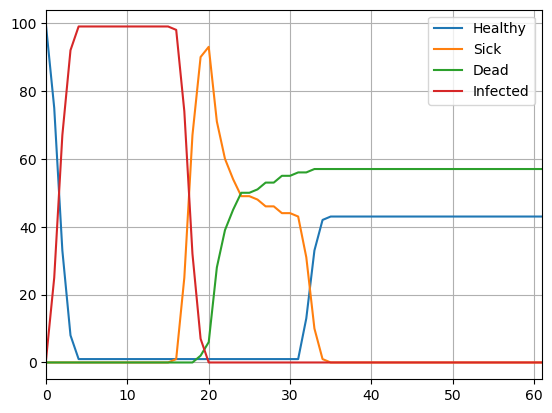

In [21]:
df.plot(grid=True)
plt.show()

We can see that quarantine doesn't help a lot in case if all members of community already infected. And still we  have to admit that number of dead people a little bit decreased.

Now let’s see the behavior of non-aggressive virus with the mortality rate close to our first experiments.

In [22]:
non_agressive = {'incubation':9,'recovery':1,'mortality':.01, 'immunity_adapt':2, 'virality':1}
nulify_graph(G) 
Date = 0
results = virus_spread_viz(G, non_agressive, [30], 60,viz = False)
df = results[1]

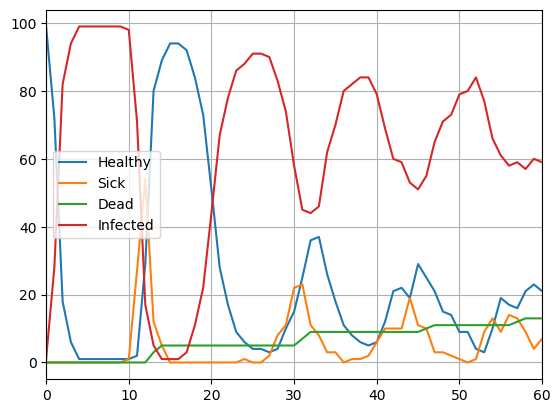

In [23]:
df.plot(grid=True)
plt.show()

In [24]:
df.tail()

,Healthy,Sick,Dead,Infected
56,17,14,11,58
57,16,13,12,59
58,21,9,13,57
59,23,4,13,60
60,21,7,13,59


Interesting, we can see a clear seasonal pattern, despite the fact that recovery is the only one day we and mortality is 1 percent, we can see that we had 13% of death rate after 2 months. 
Let’s see all viruses together close to each other to compare.

## Explanation visualization

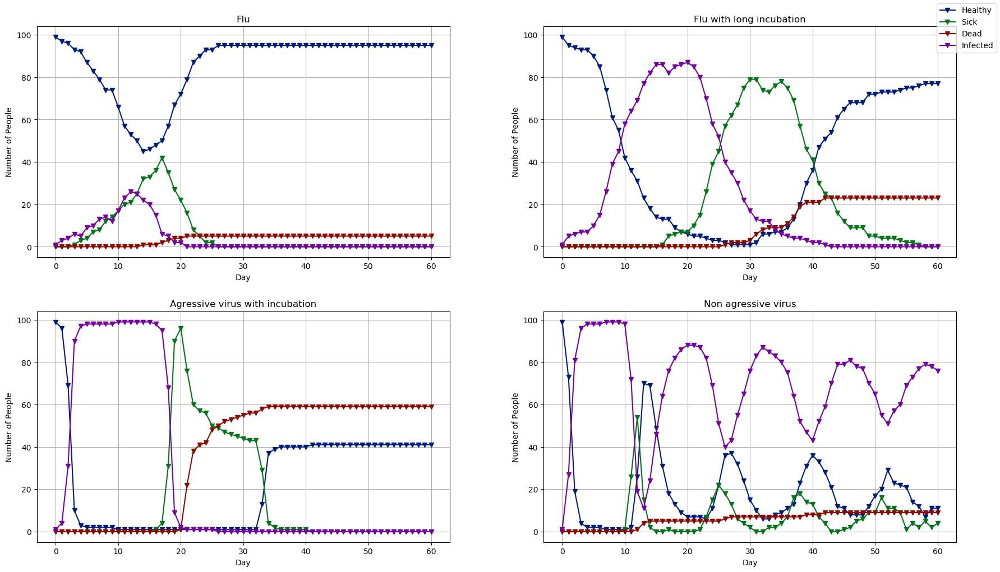

In [26]:
fig, ax = plt.subplots(2,2)
fig.tight_layout()
fig.set_size_inches(18.5, 10.5)
viruses = [[flu, long_incubation_flu], 
            [unknown_agressive_virus,non_agressive]]
titles = [['Flu', 'Flu with long incubation'], 
          ['Agressive virus with incubation', 'Non agressive virus']]
for i in list(range(2)):
    for j in list(range(2)):
        nulify_graph(G)
        results = virus_spread_viz(G, viruses[i][j], [30], 60, viz = False)
        df = results[1]
        subax = ax[i,j]
        subax.plot(df, 'v-')
        subax.set_title(titles[i][j])
        subax.grid(True)
        subax.set(xlabel = 'Day', ylabel = 'Number of People')
plt.style.use('seaborn-dark-palette')
fig.legend(df.columns)

plt.show()
plt.close()

In this visualization we can see the difference of the behavior of different viruses, first the flu, due to short incubation period, it often dies out in the beginning of epidemic, if we increase incubation period we can see that society is much more affected, if we increase the mortality rate, more than a half nodes become dead. However, all 3 viruses dies out by themselves and only the fourth one, due to low mortality and short recovery period continues to circulate within the community after 2 months, having seasonal and slowly declining pattern.